# Global Insights: Country Clustering Analysis Using Unsupervised Machine Learning

#### Objective:
To categorise the countries using socio-economic and health factors that determine the overall development of the country.

#### About organization:
HELP International is an international humanitarian NGO that is committed to fighting poverty and providing the people of backward countries with basic amenities and relief during the time of disasters and natural calamities.

#### Problem Statement:
HELP International have been able to raise around $ 10 million. Now the CEO of the NGO needs to decide how to use this money strategically and effectively. So, CEO has to make decision to choose the countries that are in the direst need of aid. Hence, your Job as a Data scientist is to categorise the countries using some socio-economic and health factors that determine the overall development of the country. Then you need to suggest the countries which the CEO needs to focus on the most.

### Data

The dataset used for this analysis is available on Kaggle and is titled "Unsupervised Learning on Country Data". The dataset contains information about various countries and includes the following columns:

- `country`: Name of the country
- `child_mort`: Child mortality rate (per 1000 live births)
- `exports`: Exports of goods and services (% of GDP)
- `health`: Total health spending (% of GDP)
- `imports`: Imports of goods and services (% of GDP)
- `income`: Net income per person
- `inflation`: The measurement of the annual growth rate of the Total GDP
- `life_expec`: Life expectancy at birth (in years)
- `total_fer`: The number of children that would be born to each woman if the current age-fertility rates remain the same
- `gdpp`: Gross Domestic Product per capita

The dataset can be accessed through the following link: [Unsupervised Learning on Country Data](https://www.kaggle.com/datasets/rohan0301/unsupervised-learning-on-country-data?select=Country-data.csv).



In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from scipy.stats import boxcox

In [2]:
countries_data = pd.read_csv('../Data/Country-data.csv')
countries_data.head(2)

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090


In [3]:
countries_data = countries_data.set_index('country')
countries_data.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200


In [4]:
Bangladesh_data = countries_data.loc['Bangladesh']
Bangladesh_data

child_mort      49.40
exports         16.00
health           3.52
imports         21.80
income        2440.00
inflation        7.14
life_expec      70.40
total_fer        2.33
gdpp           758.00
Name: Bangladesh, dtype: float64

#### Learing about the data

In [5]:
countries_data.shape

(167, 9)

In [6]:
countries_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 167 entries, Afghanistan to Zambia
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   child_mort  167 non-null    float64
 1   exports     167 non-null    float64
 2   health      167 non-null    float64
 3   imports     167 non-null    float64
 4   income      167 non-null    int64  
 5   inflation   167 non-null    float64
 6   life_expec  167 non-null    float64
 7   total_fer   167 non-null    float64
 8   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2)
memory usage: 17.1+ KB


In [7]:
countries_data.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


#### Data Cleaning

In [8]:
# num of missing value
countries_data.isna().sum()

child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [9]:
def find_outliers(df, col, q1, q3):
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    return outliers

def box_plot_all(df):
    for col in df.select_dtypes(exclude='object').columns:
        if col != 'Price':  # excluding price because it is our target
            sns.boxplot(data=df[col])

            # Calculate mean, Q1, and Q3
            mean_val = df[col].mean()
            q1 = np.percentile(df[col], 25)
            q3 = np.percentile(df[col], 75)
            
            # Plot mean, Q1, and Q3 levels
            plt.axhline(mean_val, color='r', linestyle='--', label='Mean')
            plt.axhline(q1, color='g', linestyle='--', label='Q1')
            plt.axhline(q3, color='b', linestyle='--', label='Q3')
            plt.title(f'Box Plot of {col}')
            plt.legend()
            plt.show()

            # Find and display percentage of outliers
            outliers = find_outliers(df, col, q1, q3)
            print('{} - % of outliers: {}%'.format(col, round(outliers.shape[0] / df.shape[0] * 100, 2)))
            print(outliers[col])



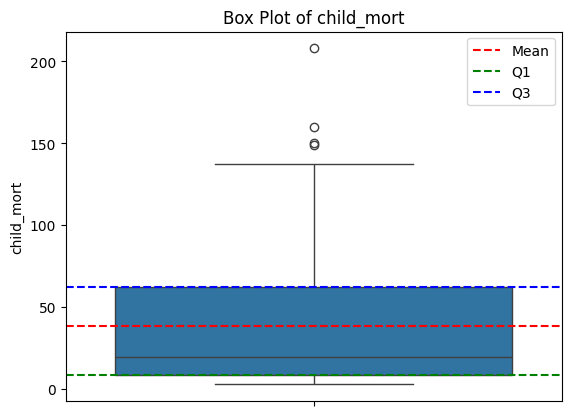

child_mort - % of outliers: 2.4%
country
Central African Republic    149.0
Chad                        150.0
Haiti                       208.0
Sierra Leone                160.0
Name: child_mort, dtype: float64


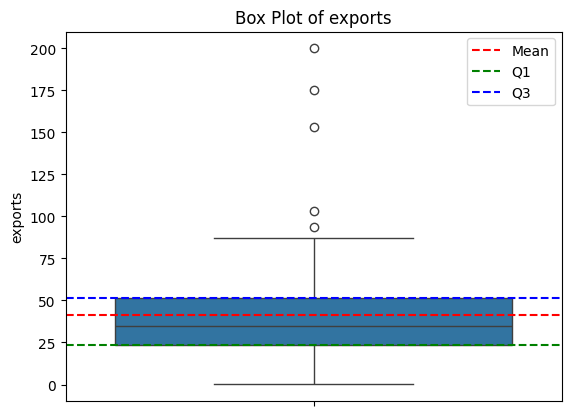

exports - % of outliers: 2.99%
country
Ireland       103.0
Luxembourg    175.0
Malta         153.0
Seychelles     93.8
Singapore     200.0
Name: exports, dtype: float64


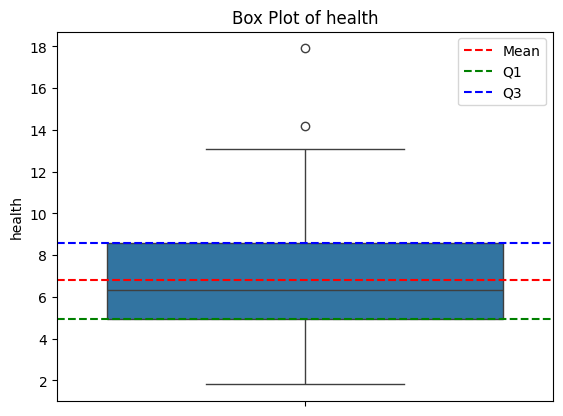

health - % of outliers: 1.2%
country
Micronesia, Fed. Sts.    14.2
United States            17.9
Name: health, dtype: float64


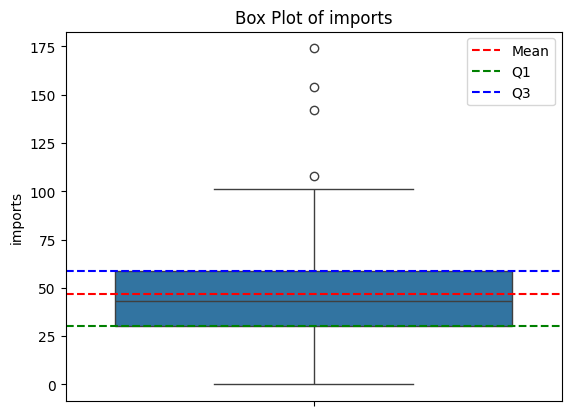

imports - % of outliers: 2.4%
country
Luxembourg    142.0
Malta         154.0
Seychelles    108.0
Singapore     174.0
Name: imports, dtype: float64


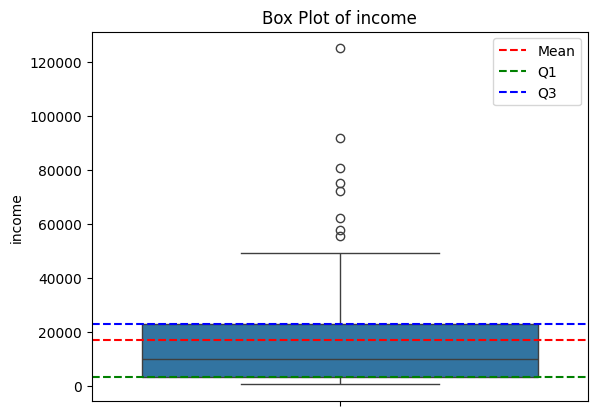

income - % of outliers: 4.79%
country
Brunei                   80600
Kuwait                   75200
Luxembourg               91700
Norway                   62300
Qatar                   125000
Singapore                72100
Switzerland              55500
United Arab Emirates     57600
Name: income, dtype: int64


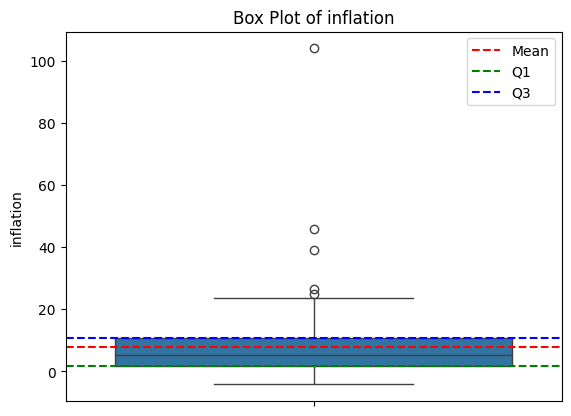

inflation - % of outliers: 2.99%
country
Equatorial Guinea     24.9
Mongolia              39.2
Nigeria              104.0
Timor-Leste           26.5
Venezuela             45.9
Name: inflation, dtype: float64


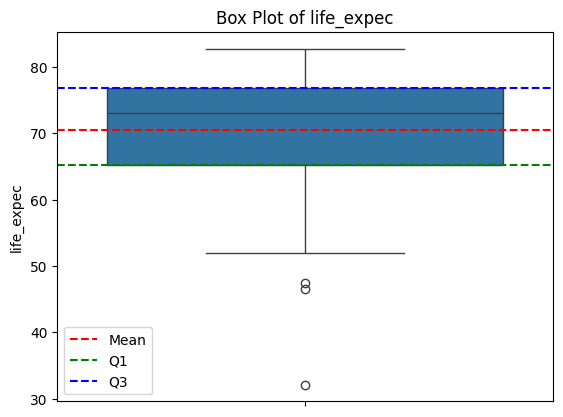

life_expec - % of outliers: 1.8%
country
Central African Republic    47.5
Haiti                       32.1
Lesotho                     46.5
Name: life_expec, dtype: float64


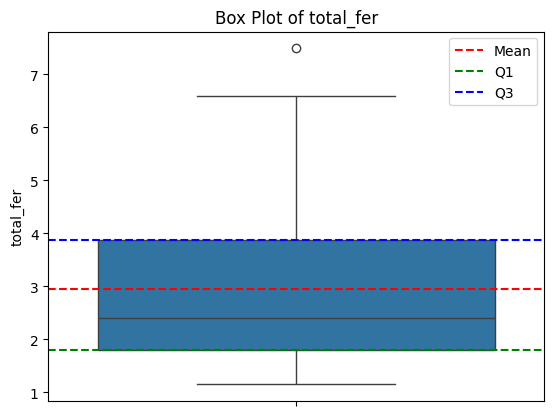

total_fer - % of outliers: 0.6%
country
Niger    7.49
Name: total_fer, dtype: float64


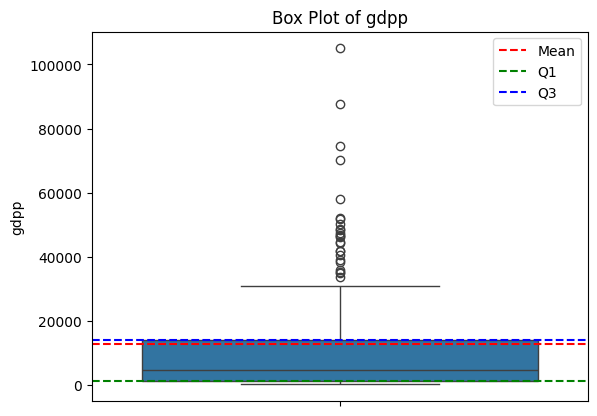

gdpp - % of outliers: 14.97%
country
Australia                51900
Austria                  46900
Belgium                  44400
Brunei                   35300
Canada                   47400
Denmark                  58000
Finland                  46200
France                   40600
Germany                  41800
Iceland                  41900
Ireland                  48700
Italy                    35800
Japan                    44500
Kuwait                   38500
Luxembourg              105000
Netherlands              50300
New Zealand              33700
Norway                   87800
Qatar                    70300
Singapore                46600
Sweden                   52100
Switzerland              74600
United Arab Emirates     35000
United Kingdom           38900
United States            48400
Name: gdpp, dtype: int64


In [10]:
box_plot_all(countries_data)

All data seems to be right, we do not need to fix any outlier

#### EDA

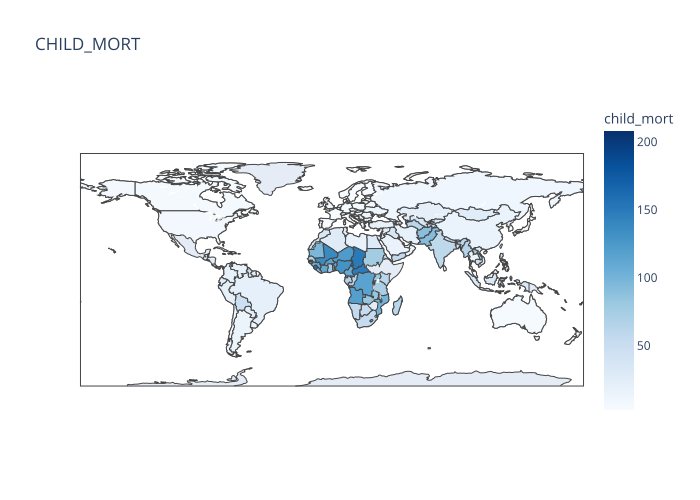

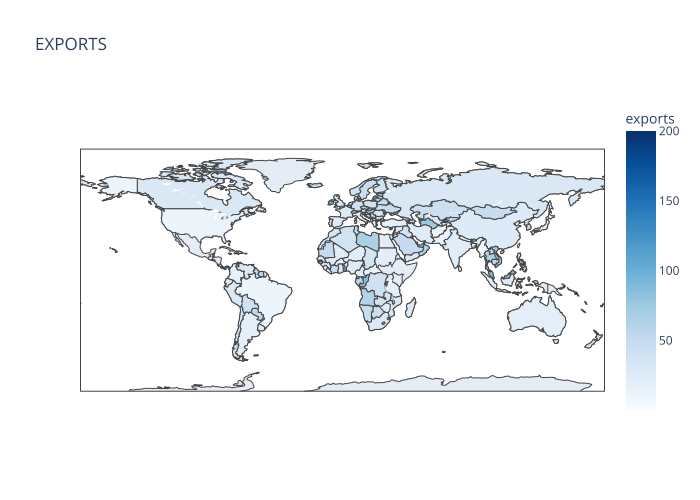

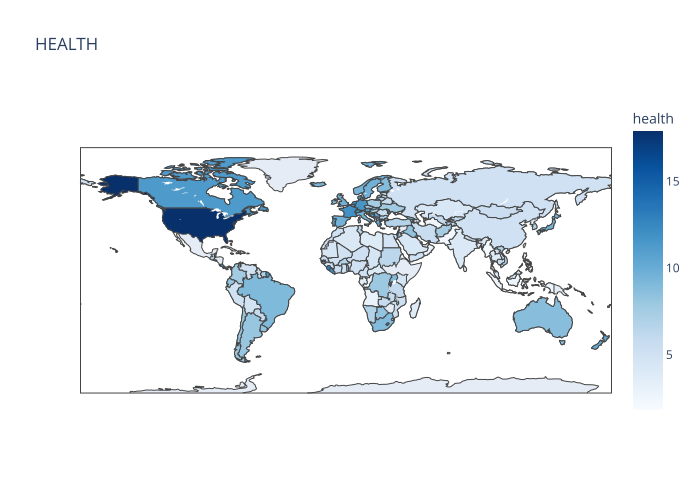

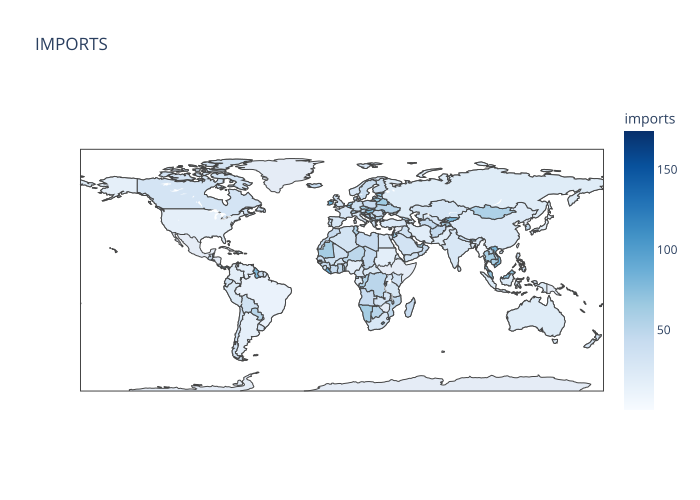

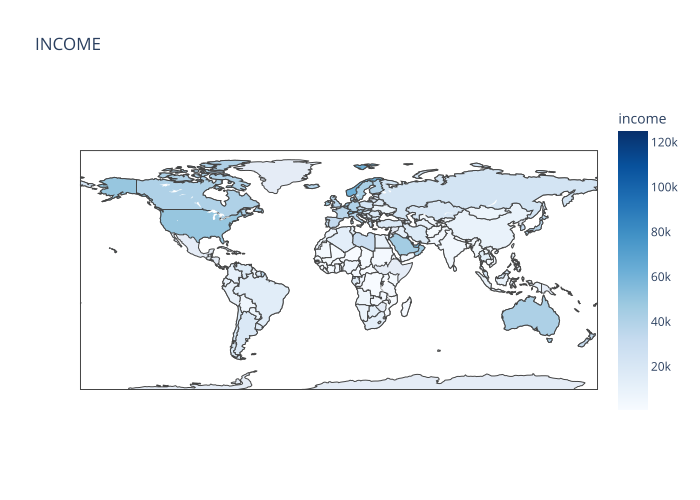

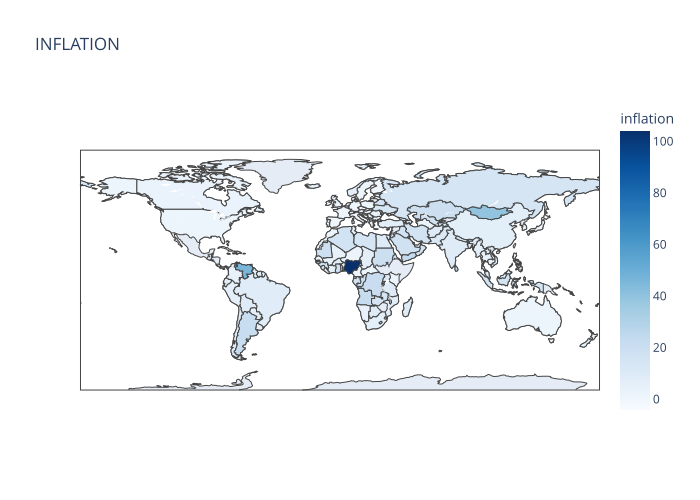

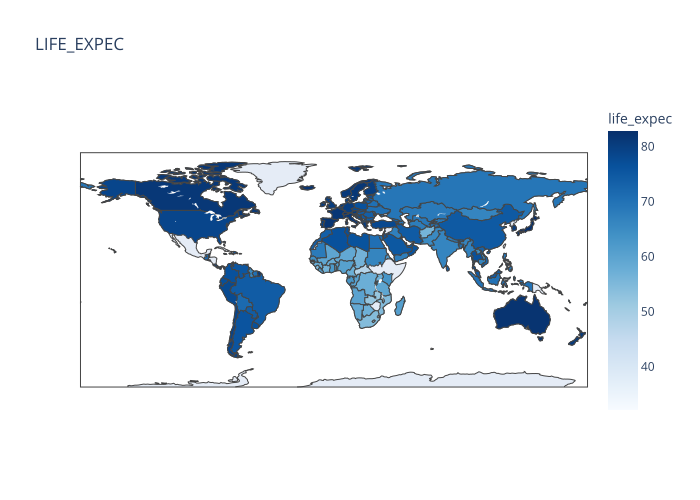

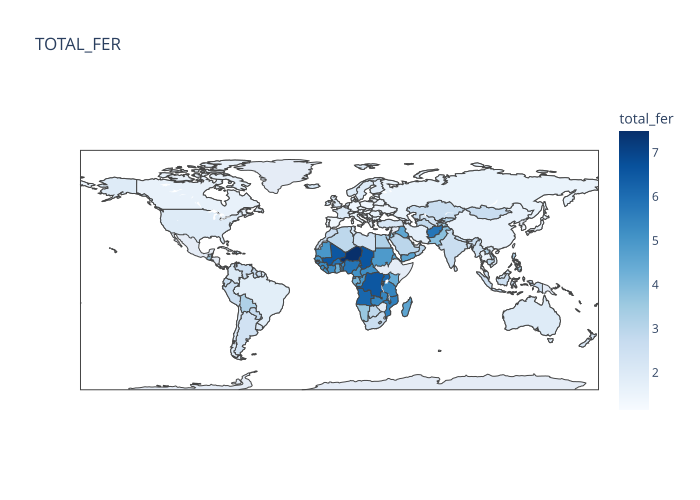

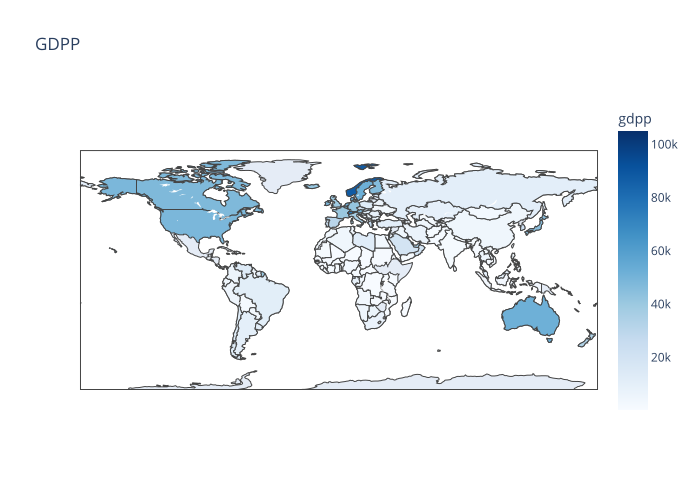

In [11]:
def create_choropleth_maps(df):
    for i in df.columns:
        fig = px.choropleth(df.reset_index(),
                            locationmode='country names',
                            locations='country',
                            title=i.upper(),
                            color=i,
                            color_continuous_scale="Blues",
                        )
        fig.update_geos(fitbounds="locations", visible=True)
        fig.show(renderer="svg")
create_choropleth_maps(countries_data)

In [12]:
# sns.pairplot(transformed_df)
# plt.show()

In [13]:
countries_data.corr().style.background_gradient()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.318093,-0.200402,-0.127211,-0.524315,0.288276,-0.886676,0.848478,-0.483032
exports,-0.318093,1.000000,-0.114408,0.737381,0.516784,-0.107294,0.316313,-0.320011,0.418725
health,-0.200402,-0.114408,1.000000,0.095717,0.129579,-0.255376,0.210692,-0.196674,0.345966
imports,-0.127211,0.737381,0.095717,1.000000,0.122406,-0.246994,0.054391,-0.159048,0.115498
income,-0.524315,0.516784,0.129579,0.122406,1.000000,-0.147756,0.611962,-0.501840,0.895571
inflation,0.288276,-0.107294,-0.255376,-0.246994,-0.147756,1.000000,-0.239705,0.316921,-0.221631
life_expec,-0.886676,0.316313,0.210692,0.054391,0.611962,-0.239705,1.000000,-0.760875,0.600089
total_fer,0.848478,-0.320011,-0.196674,-0.159048,-0.501840,0.316921,-0.760875,1.000000,-0.454910
gdpp,-0.483032,0.418725,0.345966,0.115498,0.895571,-0.221631,0.600089,-0.454910,1.000000


In [14]:
def corr_matrix(data):
    corr_matrix = data.corr()
    
    for var in corr_matrix.columns:
        corr_matrix[var] = corr_matrix[var].apply(lambda x:x if abs(x) > 0.70 and abs(x) < 1 else '')
    
    return corr_matrix

corr_matrix(countries_data)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,,,-0.886676,0.848478,
exports,,,,0.737381,,,,,
health,,,,,,,,,
imports,,0.737381,,,,,,,
income,,,,,,,,,0.895571
inflation,,,,,,,,,
life_expec,-0.886676,,,,,,,-0.760875,
total_fer,0.848478,,,,,,-0.760875,,
gdpp,,,,,0.895571,,,,


#### Transformation

In [15]:
def boxcox_transform(df, constant=0.01):
    transformed_data = pd.DataFrame(index=df.index)  # Initialize DataFrame for transformed data with original index
    
    for column in df.select_dtypes(include=[np.number]):
        column_data = df[column].dropna()  # Drop missing values
        min_value = column_data.min()
        if min_value <= 0:
            column_data += abs(min_value) + constant  # Add a constant to ensure all values are positive
        transformed_values, _ = boxcox(column_data)
        transformed_data[column] = transformed_values
    
    return transformed_data

transformed_df = boxcox_transform(countries_data)

In [16]:
transformed_df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
country,,,,,,,,,
Afghanistan,4.596747,3.577908,2.941042,10.015630,10.833801,3.745020,8.586498e+05,1.189628,6.275042
Albania,2.846095,6.419617,2.652941,10.457084,14.938781,2.906548,2.675527e+06,0.445233,8.246485
Algeria,3.357802,7.523315,1.849401,8.205482,15.591688,4.571104,2.701689e+06,0.831924,8.331631
Angola,4.885951,9.476151,1.263567,9.768596,13.688497,5.183649,1.101861e+06,1.213716,8.101681
Antigua and Barbuda,2.357391,8.169779,2.496145,11.595984,16.602865,2.190407,2.741282e+06,0.634312,9.319886
...,...,...,...,...,...,...,...,...,...
Vanuatu,3.427188,8.264001,2.243473,10.925065,12.119789,2.495148,1.312811e+06,0.941978,7.931757
Venezuela,2.876553,6.478217,2.125639,5.824603,16.221298,6.799245,2.560084e+06,0.733832,9.419214
Vietnam,3.194584,10.128989,2.736880,13.642586,13.057682,4.104579,2.281623e+06,0.571532,7.125734


In [17]:
transformed_df.corr().style.background_gradient()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,1.000000,-0.418049,-0.345278,-0.159022,-0.857661,0.429721,-0.913018,0.861221,-0.875941
exports,-0.418049,1.000000,-0.076892,0.670786,0.528811,-0.178139,0.339487,-0.369051,0.482957
health,-0.345278,-0.076892,1.000000,0.150612,0.135468,-0.303367,0.273514,-0.265663,0.251192
imports,-0.159022,0.670786,0.150612,1.000000,0.042087,-0.322692,0.044210,-0.160017,0.056133
income,-0.857661,0.528811,0.135468,0.042087,1.000000,-0.253511,0.838362,-0.742142,0.974390
inflation,0.429721,-0.178139,-0.303367,-0.322692,-0.253511,1.000000,-0.365269,0.391192,-0.319505
life_expec,-0.913018,0.339487,0.273514,0.044210,0.838362,-0.365269,1.000000,-0.778634,0.849076
total_fer,0.861221,-0.369051,-0.265663,-0.160017,-0.742142,0.391192,-0.778634,1.000000,-0.725514
gdpp,-0.875941,0.482957,0.251192,0.056133,0.974390,-0.319505,0.849076,-0.725514,1.000000


In [18]:
def corr_matrix(data):
    corr_matrix = data.corr()
    
    for var in corr_matrix.columns:
        corr_matrix[var] = corr_matrix[var].apply(lambda x:x if abs(x) > 0.70 and abs(x) < 1 else '')
    
    return corr_matrix

corr_matrix(transformed_df)

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
child_mort,,,,,-0.857661,,-0.913018,0.861221,-0.875941
exports,,,,,,,,,
health,,,,,,,,,
imports,,,,,,,,,
income,-0.857661,,,,,,0.838362,-0.742142,0.97439
inflation,,,,,,,,,
life_expec,-0.913018,,,,0.838362,,,-0.778634,0.849076
total_fer,0.861221,,,,-0.742142,,-0.778634,,-0.725514
gdpp,-0.875941,,,,0.97439,,0.849076,-0.725514,


In [19]:
# print('Pairplot - Data BoxCox Transformed')
# sns.pairplot(transformed_df)
# plt.show()

In [20]:
transformed_df.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,1.670000e+02,167.000000,167.000000
mean,3.097442,7.317915,2.626042,9.880608,14.901508,3.165718,2.149661e+06,0.736725,8.424487
std,1.193050,2.324811,0.790564,2.744099,2.980422,1.275490,8.480344e+05,0.296682,1.474336
min,0.959732,-1.529486,0.659003,-1.573824,8.922385,-2.683594,1.070752e+05,0.135186,5.412459
25%,2.129960,5.898570,2.129177,8.025118,12.402926,2.290620,1.499989e+06,0.510173,7.140555
50%,3.000858,7.186307,2.584629,9.818505,14.946213,3.081479,2.281623e+06,0.717791,8.374754
75%,4.208314,8.655258,3.202136,11.580215,17.071952,3.927933,2.741282e+06,0.997138,9.457627
max,5.471019,15.840536,4.967345,20.211925,22.019941,9.159315,3.625682e+06,1.291821,11.427072


In [21]:
scaled_transformed_df = StandardScaler().fit_transform(transformed_df)
scaled_transformed_df

array([[ 1.2604782 , -1.61357374,  0.39964884, ..., -1.52693606,
         1.53115139, -1.46229162],
       [-0.21131004, -0.38755808,  0.03412817, ...,  0.62196501,
        -0.98546004, -0.12109696],
       [ 0.21888666,  0.08861708, -0.98534321, ...,  0.65290794,
         0.32184545, -0.06317096],
       ...,
       [ 0.08166811,  1.21279898,  0.14062292, ...,  0.15607677,
        -0.5584737 , -0.88355628],
       [ 0.84832929, -0.28809609, -0.51562558, ..., -0.53585296,
         1.19358826, -0.88355628],
       [ 1.18865968,  0.02979011, -0.220261  , ..., -1.78161856,
         1.42027078, -0.8108792 ]])

### Model Development

In [22]:
# libraries
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from scipy.cluster import hierarchy
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

#### KMeans

Pairplot - Number of K-Means clusters (using all data features): 4


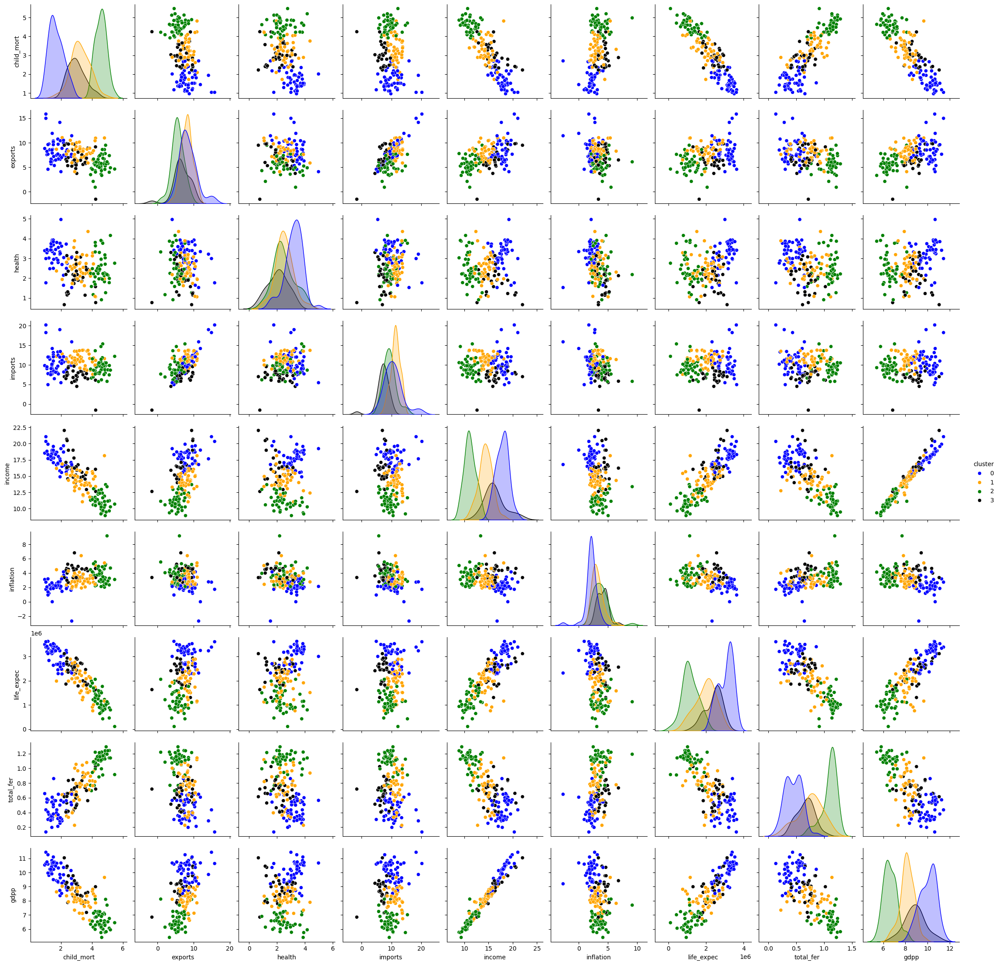

In [23]:
km = KMeans(init='k-means++', n_clusters=4, random_state=98)
km.fit(scaled_transformed_df)
transformed_df['cluster'] = km.labels_
print('Pairplot - Number of K-Means clusters (using all data features): 4')
sns.pairplot(transformed_df, hue='cluster', palette={0:'blue', 1:'orange', 2:'green',3:'Black'})
plt.show()

In [24]:
slct_ds = transformed_df.drop(['health', 'imports', 'inflation', 'exports', 'cluster'], axis=1)
slct_ds_scld = StandardScaler().fit_transform(slct_ds)

In [25]:
km = KMeans(init='k-means++', n_clusters=4, random_state=98)
km.fit(slct_ds_scld)
km_cluster = pd.DataFrame(slct_ds_scld, index=slct_ds.index)
km_cluster['cluster'] = km.labels_
km_cluster.tail()

,0,1,2,3,4,cluster
country,,,,,,
Vanuatu,0.277220,-0.936138,-0.989779,0.693909,-0.335210,2
Venezuela,-0.185703,0.444152,0.485425,-0.009781,0.676724,3
Vietnam,0.081668,-0.620507,0.156077,-0.558474,-0.883556,2
Yemen,0.848329,-0.622217,-0.535853,1.193588,-0.883556,2
Zambia,1.188660,-0.857680,-1.781619,1.420271,-0.810879,1


In [26]:
# Reduce the dimension to 2 components to visualize clusters on a 2d plot
pca = PCA(n_components=2)
pca_data = pca.fit_transform(km_cluster.iloc[:,:-1])
pca_data = pd.DataFrame(pca_data, index=slct_ds.index, columns=['1st Principal Component', '2nd Principal Component'])
pca_data['cluster'] = km.labels_
pca_data.head()

,1st Principal Component,2nd Principal Component,cluster
country,,,
Afghanistan,-3.190472,0.132609,1
Albania,0.739870,-0.843691,3
Algeria,0.133452,0.319914,3
Angola,-2.209307,1.244740,1
Antigua and Barbuda,1.281350,0.136909,3


Cluster 1: countries with the highest values in Income, Life Expectancy, GDP per capita, and lowest values in Child Mortality and Total Fertility. We can label these countries as "Highly developed".

Cluster 3: these countries have lower values than the Highly Developed observations in Income, Life Expectancy, GDP per capita but still above the overall average. Also have higher values than cluster 1 in Child Mortality and Total Fertility, however below the dataset average. We can label these countries as "Upper-middle developed".

Cluster 0: countries with Income, Life Expectancy, GDP per capita mean values below the average, and Child Mortality and Total Fertility mean values above the average. We can label these countries as "Lower-middle developed".

Cluster 2: countries with, by far, the highest values in Child Mortality and Total Fertility as well as the smallest values in Income, Life Expectancy, and GDP per capita. We can label these countries as the "Least developed".

In [27]:
countries_data['cluster'] = km.labels_
countries_data['label'] = None

countries_data.loc[countries_data['cluster'] == 0, 'label'] = 'Highly Developed'
countries_data.loc[countries_data['cluster'] == 1, 'label'] = 'Least Developed'
countries_data.loc[countries_data['cluster'] == 2, 'label'] = 'Lower-Middle Developed'
countries_data.loc[countries_data['cluster'] == 3, 'label'] = 'Upper-middle developed'
countries_data.head()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,cluster,label
country,,,,,,,,,,,
Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,Least Developed
Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,3,Upper-middle developed
Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,3,Upper-middle developed
Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,Least Developed
Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,3,Upper-middle developed


In [28]:
countries_data.groupby('label')['cluster'].count()

label
Highly Developed          40
Least Developed           39
Lower-Middle Developed    37
Upper-middle developed    51
Name: cluster, dtype: int64

In [29]:
countries_data.groupby(['cluster','label'], as_index=True).mean()

,,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
cluster,label,,,,,,,,,
0,Highly Developed,5.050000,58.730000,8.641500,51.977500,43277.500000,2.567900,79.692500,1.725750,39590.000000
1,Least Developed,98.094872,26.895128,6.400769,43.784615,2082.128205,11.166795,58.464103,5.196154,933.897436
2,Lower-Middle Developed,42.581081,37.929432,5.670270,47.504484,7065.675676,9.694081,67.772973,3.211892,3319.783784
3,Upper-middle developed,15.449020,40.464706,6.531961,44.829412,15479.019608,7.895373,74.654902,1.995882,8277.647059


In [30]:
def create_choropleth_map(df, as_svg=False):
    fig = px.choropleth(df.reset_index(),
                        locationmode='country names',
                        locations='country',
                        color='label',
                        title='Countries',
                        hover_name='country',
                        labels={'label': 'Cluster Label'},
                        color_discrete_map={
                            'Least Developed': 'lightcoral',
                            'Upper-middle developed': 'lightblue',
                        }
                    )
    fig.update_geos(fitbounds="locations", visible=True)
    fig.update_layout(height=600, width=1000)
    fig.show(fullscreen=True, renderer="svg" if as_svg else None)
    fig.write_image("../Img/choropleth_map_of_all_countries.png")

# Call the function with the provided data
create_choropleth_map(countries_data)


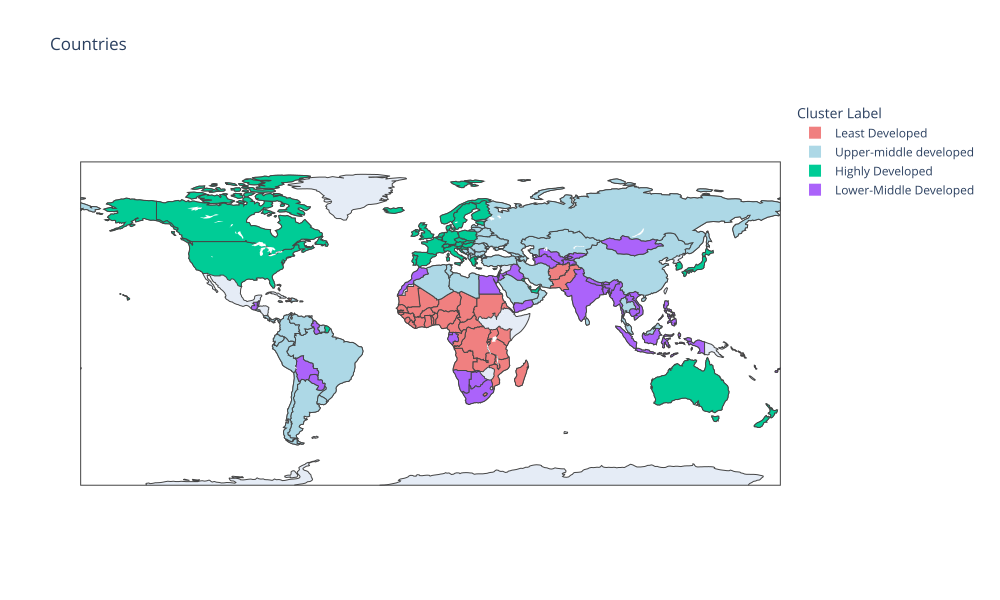

In [31]:
create_choropleth_map(countries_data, as_svg=True)

In [32]:
print(f"Highly developed countries are {countries_data[countries_data['cluster']==0].index.values}")

Highly developed countries are ['Australia' 'Austria' 'Bahrain' 'Belgium' 'Brunei' 'Canada' 'Croatia'
 'Cyprus' 'Czech Republic' 'Denmark' 'Estonia' 'Finland' 'France'
 'Germany' 'Greece' 'Hungary' 'Iceland' 'Ireland' 'Israel' 'Italy' 'Japan'
 'Kuwait' 'Luxembourg' 'Malta' 'Netherlands' 'New Zealand' 'Norway'
 'Poland' 'Portugal' 'Qatar' 'Singapore' 'Slovak Republic' 'Slovenia'
 'South Korea' 'Spain' 'Sweden' 'Switzerland' 'United Arab Emirates'
 'United Kingdom' 'United States']


In [33]:
print(f"Least developed countries are {countries_data[countries_data['cluster']==1].index.values}")

Least developed countries are ['Afghanistan' 'Angola' 'Benin' 'Burkina Faso' 'Burundi' 'Cameroon'
 'Central African Republic' 'Chad' 'Comoros' 'Congo, Dem. Rep.'
 'Congo, Rep.' "Cote d'Ivoire" 'Eritrea' 'Gambia' 'Ghana' 'Guinea'
 'Guinea-Bissau' 'Haiti' 'Kenya' 'Kiribati' 'Lesotho' 'Liberia'
 'Madagascar' 'Malawi' 'Mali' 'Mauritania' 'Mozambique' 'Niger' 'Nigeria'
 'Pakistan' 'Rwanda' 'Senegal' 'Sierra Leone' 'Solomon Islands' 'Sudan'
 'Tanzania' 'Togo' 'Uganda' 'Zambia']


In [34]:
print(f"Lower-Middle developed countries are {countries_data[countries_data['cluster']==2].index.values}")

Lower-Middle developed countries are ['Bangladesh' 'Belize' 'Bhutan' 'Bolivia' 'Botswana' 'Cambodia'
 'Cape Verde' 'Egypt' 'Equatorial Guinea' 'Fiji' 'Gabon' 'Guatemala'
 'Guyana' 'India' 'Indonesia' 'Iraq' 'Jordan' 'Kyrgyz Republic' 'Lao'
 'Micronesia, Fed. Sts.' 'Mongolia' 'Morocco' 'Myanmar' 'Namibia' 'Nepal'
 'Paraguay' 'Philippines' 'Samoa' 'South Africa' 'Tajikistan'
 'Timor-Leste' 'Tonga' 'Turkmenistan' 'Uzbekistan' 'Vanuatu' 'Vietnam'
 'Yemen']


In [35]:
print(f"Upper-Middle Developed countries are {countries_data[countries_data['cluster']==3].index.values}")

Upper-Middle Developed countries are ['Albania' 'Algeria' 'Antigua and Barbuda' 'Argentina' 'Armenia'
 'Azerbaijan' 'Bahamas' 'Barbados' 'Belarus' 'Bosnia and Herzegovina'
 'Brazil' 'Bulgaria' 'Chile' 'China' 'Colombia' 'Costa Rica'
 'Dominican Republic' 'Ecuador' 'El Salvador' 'Georgia' 'Grenada' 'Iran'
 'Jamaica' 'Kazakhstan' 'Latvia' 'Lebanon' 'Libya' 'Lithuania'
 'Macedonia, FYR' 'Malaysia' 'Maldives' 'Mauritius' 'Moldova' 'Montenegro'
 'Oman' 'Panama' 'Peru' 'Romania' 'Russia' 'Saudi Arabia' 'Serbia'
 'Seychelles' 'Sri Lanka' 'St. Vincent and the Grenadines' 'Suriname'
 'Thailand' 'Tunisia' 'Turkey' 'Ukraine' 'Uruguay' 'Venezuela']


In [ ]:
# jupyter nbconvert --execute --to html Cluster.ipynb
# comment to genarate a HTML